In [1]:
#NOTE: NOTE SURE WHY BUT PCA DOES NOT SEEM TO WORK ON MY ENVIRONMENT, SEEMS TO WORK FINE OFF OF IT THOUGH...

# Import libraries i will need
import os

#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#import random as python_random
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
#import gc
import re

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
#import the libraries necessary for confusion plot
import seaborn as sns
from matplotlib import colors

import gc
from sklearn.cluster import AgglomerativeClustering
from sklearn import metrics

from PIL import Image
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"

import tifffile
import scipy.cluster.hierarchy as shc
import geopandas as gpd
import contextily as cx
import matplotlib.colors

In [2]:
%%time
pc_df25 = pd.read_csv('../data/processed/image-features/all_25m_pca-21-12-22.csv',index_col=0) 
pc_df100 = pd.read_csv('../data/processed/image-features/all_100m_pca-21-12-22.csv',index_col=0)

pc_df25.head()

pc_df25["file_path"] = [w.replace('-25m', '') for w in pc_df25["file_path"]]
pc_df100["file_path"] = [w.replace('-100m', '') for w in pc_df100["file_path"]]

pc_df25["file_path"] = [w.replace('gloucester-point-', '') for w in pc_df25["file_path"]]
pc_df25["file_path"] = [w.replace('oxford-point-', '') for w in pc_df25["file_path"]]
pc_df25["file_path"] = [w.replace('cambdrige-point-', '') for w in pc_df25["file_path"]]
pc_df25["file_path"] = [w.replace('cambridge-point-', '') for w in pc_df25["file_path"]]

pc_df100["file_path"] = [w.replace('gloucester-point-', '') for w in pc_df100["file_path"]]
pc_df100["file_path"] = [w.replace('oxford-point-', '') for w in pc_df100["file_path"]]
pc_df100["file_path"] = [w.replace('cambdrige-point-', '') for w in pc_df100["file_path"]]
pc_df100["file_path"] = [w.replace('cambridge-point-', '') for w in pc_df100["file_path"]]

pc_df25["file_path"] = [w.replace(' ', '') for w in pc_df25["file_path"]]
pc_df100["file_path"] = [w.replace(' ', '') for w in pc_df100["file_path"]]

# # only keep the features that exist in both datasets
# pc_df25.file_path.isin(pc_df100.file_path).value_counts()
pc_df100.file_path.isin(pc_df25.file_path).value_counts()

# Filter rows down to the 53,515 matching
pc_df25 =pc_df25[pc_df25.file_path.isin(pc_df100.file_path)]
pc_df100 =pc_df100[pc_df100.file_path.isin(pc_df25.file_path)]

# pull out filepath to create the actual paths (not for merging)
filepath100 = pc_df100["file_path"]
filepath25 = pc_df25["file_path"]

filepath100 = [w.replace('../data', 'data') for w in filepath100]
filepath25 = [w.replace('../data', 'data') for w in filepath25]

test = [e[15:23] for e in filepath100]
print(set(test))

# these should now match the actual files, and hopefully what is in the Rtc file
filepath25 = [w.replace('cam-2020/', 'cam-2020-25m/cambridge-25m-point-') for w in filepath25]
filepath25 = [w.replace('oxf-2019/', 'oxf-2019-25m/oxford-25m-point-') for w in filepath25]
filepath25 = [w.replace('glo-2018/', 'glo-2018-25m/gloucester-25m-point-') for w in filepath25]

filepath100 = [w.replace('cam-2020/', 'cam-2020-100m/cambridge-100m-point-') for w in filepath100]
filepath100 = [w.replace('oxf-2019/', 'oxf-2019-100m/oxford-100m-point-') for w in filepath100]
filepath100 = [w.replace('glo-2018/', 'glo-2018-100m/cambridge-100m-point-') for w in filepath100]

pc_df100["filepath_full"] = filepath100
pc_df25["filepath_full"] = filepath25

pc_df25 = pc_df25.add_suffix('_25m')
pc_df100 = pc_df100.add_suffix('_100m')

pc_all = pd.merge(pc_df25,pc_df100,left_on='file_path_25m',right_on='file_path_100m',how="left")

pc_all = pc_all.drop('file_path_25m', axis=1) # drop id column
pc_all = pc_all.drop('file_path_100m', axis=1) # drop id column

{'oxf-2019', 'glo-2018', 'cam-2020'}
Wall time: 2min 9s


In [3]:
#read in the RTC data
#rtc = pd.read_csv('../data/processed/rtc/all_rtc_points.csv')
rtc = pd.read_csv('../data/processed/rtc/all_rtc_points_03012023.csv')
rtc.head()
rtc.info()

# most but not all match... these are likely just points without a matching 100m buffer
pc_all.filepath_full_25m.isin(rtc.file_path).value_counts()
rtc.file_path.isin(pc_all.filepath_full_25m).value_counts()

# shuold be basically all isin, likely cambridge other spelling if not

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10072 entries, 0 to 10071
Data columns (total 30 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   point_id                 10072 non-null  int64 
 1   night_count              10072 non-null  int64 
 2   morning_count            10072 non-null  int64 
 3   afternoon_evening_count  10072 non-null  int64 
 4   mid_of_day_count         10072 non-null  int64 
 5   wet_count                10072 non-null  int64 
 6   cycle_count              10072 non-null  int64 
 7   pedestrian_count         10072 non-null  int64 
 8   motorcycle_count         10072 non-null  int64 
 9   serious_count            10072 non-null  int64 
 10  dark_count               10072 non-null  int64 
 11  multi_vehicle_count      10072 non-null  int64 
 12  speed_above30_count      10072 non-null  int64 
 13  serious_cyclist          10072 non-null  int64 
 14  serious_pedestrian       10072 non-nul

True     9678
False     394
Name: file_path, dtype: int64

In [4]:
df_all =pd.merge(pc_all, rtc, left_on="filepath_full_25m", right_on="file_path",how="left")

# keep the file lists separate so i can read in the connected files later
filepath_25 = df_all["filepath_full_25m"]
filepath_100 = df_all["filepath_full_100m"]
df_all=df_all.fillna(0)
df_all = df_all.drop('file_path', axis=1) # drop id column
df_all = df_all.drop('filepath_full_25m', axis=1) # drop id column
df_all = df_all.drop('filepath_full_100m', axis=1) # drop id column
df_all = df_all.drop('point_id', axis=1) # drop id column

filepath_25 = [w.replace('data', '../data') for w in filepath_25]

##### Need to Separate Out the Cities ######
df_all["file_path"]= filepath_25
df_cam =df_all[df_all.file_path.str.contains("cam-20")].copy()
df_oxf =df_all[df_all.file_path.str.contains("oxf-20")].copy()
df_glo =df_all[df_all.file_path.str.contains("glo-20")].copy()

# 09/12/22 adding in a new check to eliminate points that are basically in the exact same place
# I only want to keep the ids that associate with these points 
point_check = pd.read_csv('../data/processed/image-features/final_points_200123.csv')
print(point_check.info())
point_check.head()

point_check_cam = point_check[point_check.location.str.contains("cam")]
point_check_glo = point_check[point_check.location.str.contains("glo")]
point_check_oxf = point_check[point_check.location.str.contains("oxf")]

df_cam["file_merge"]=df_cam["file_path"]
df_oxf["file_merge"]=df_oxf["file_path"]
df_glo["file_merge"]=df_glo["file_path"]

df_cam["file_merge"] = [w.replace('../data/processed/cam-2020-25m/cambridge-25m-', '') for w in df_cam["file_merge"]]
df_cam["file_merge"] = [w.replace('point-', '') for w in df_cam["file_merge"]]
df_cam["file_merge"] = [w.replace('.tif', '') for w in df_cam["file_merge"]]
df_cam["file_merge"] = pd.to_numeric(df_cam["file_merge"]) # convert to numeric

# only keep rows with values in the point check
df_cam=df_cam[df_cam.file_merge.isin(point_check_cam.row_id)]

df_oxf["file_merge"] = [w.replace('../data/processed/oxf-2019-25m/oxford-25m-', '') for w in df_oxf["file_merge"]]
df_oxf["file_merge"] = [w.replace('point-', '') for w in df_oxf["file_merge"]]
df_oxf["file_merge"] = [w.replace('.tif', '') for w in df_oxf["file_merge"]]
df_oxf["file_merge"] = pd.to_numeric(df_oxf["file_merge"]) # convert to numeric
# only keep rows with values in the point check
df_oxf=df_oxf[df_oxf.file_merge.isin(point_check_oxf.row_id)]

df_glo["file_merge"] = [w.replace('../data/processed/glo-2018-25m/gloucester-25m-', '') for w in df_glo["file_merge"]]
df_glo["file_merge"] = [w.replace('point-', '') for w in df_glo["file_merge"]]
df_glo["file_merge"] = [w.replace('.tif', '') for w in df_glo["file_merge"]]
df_glo["file_merge"] = pd.to_numeric(df_glo["file_merge"]) # convert to numeric
# only keep rows with values in the point check
df_glo=df_glo[df_glo.file_merge.isin(point_check_glo.row_id)]

print("cambridge",df_cam["rtc_count_total"].value_counts())
print("gloucester",df_glo["rtc_count_total"].value_counts())
print("oxford",df_oxf["rtc_count_total"].value_counts())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9570 entries, 0 to 9569
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   row_id    9570 non-null   int64 
 1   location  9570 non-null   object
dtypes: int64(1), object(1)
memory usage: 149.7+ KB
None
cambridge 0.0     2197
1.0      318
2.0      132
3.0       45
4.0       30
5.0       21
6.0       11
9.0        6
7.0        3
19.0       3
8.0        2
18.0       1
13.0       1
12.0       1
16.0       1
10.0       1
17.0       1
21.0       1
11.0       1
Name: rtc_count_total, dtype: int64
gloucester 0.0     2632
1.0      259
2.0       71
3.0       32
4.0       18
5.0        7
7.0        3
10.0       3
6.0        3
9.0        1
Name: rtc_count_total, dtype: int64
oxford 0.0     2555
1.0      340
2.0      121
3.0       55
4.0       32
5.0       25
7.0        8
6.0        7
8.0        6
9.0        4
38.0       1
Name: rtc_count_total, dtype: int64


In [5]:
# What if we only cluster the features with >1 RTC?
df_cam_rtc = df_cam[df_cam["rtc_count_total"]>=3]
df_glo_rtc = df_glo[df_glo["rtc_count_total"]>=3]
df_oxf_rtc = df_oxf[df_oxf["rtc_count_total"]>=3]

filepath_100 = [w.replace('-25m', '-100m') for w in filepath_25]
filepath_100 = [w.replace('cambdrige', 'cambridge') for w in filepath_100]
filepath_25 = [w.replace('cambridge', 'cambdrige') for w in filepath_25]
filepath_100 = [w.replace('glo-2018-100m/gloucester', 'glo-2018-100m/cambridge') for w in filepath_100]

In [6]:
df_oxf_rtc

,0_25m,1_25m,2_25m,3_25m,4_25m,5_25m,6_25m,7_25m,8_25m,9_25m,...,dark_wet_cyclist,rtc_year_2018,rtc_year_2017,rtc_year_2020,rtc_year_2019,rtc_count_total,X,Y,file_path,file_merge
36486,-7.647817,-8.481777,-14.367424,-21.870801,17.284990,2.144117,-5.800487,-8.942823,-5.852681,-4.485978,...,0.0,2.0,1.0,0.0,2.0,5.0,454544,207151.75,../data/processed/oxf-2019-25m/oxford-25m-poin...,1009
36741,20.721606,-1.285332,0.381427,16.716471,0.377512,9.322608,-11.358973,-0.953639,8.184922,-9.591923,...,0.0,2.0,0.0,1.0,0.0,3.0,453940,206842,../data/processed/oxf-2019-25m/oxford-25m-poin...,10322
36772,-7.184999,-4.984209,2.718965,-2.256962,-6.724510,-8.996541,4.445002,0.919143,-11.060183,-3.168227,...,0.0,2.0,1.0,0.0,0.0,3.0,448424.75,206055.5,../data/processed/oxf-2019-25m/oxford-25m-poin...,10350
37488,-2.306640,-2.359516,1.136116,-0.666513,4.286739,-10.075092,2.931942,4.831853,-7.976230,-7.530711,...,0.0,0.0,0.0,2.0,2.0,4.0,450076.5,206191.5,../data/processed/oxf-2019-25m/oxford-25m-poin...,11
38716,16.466363,5.775309,-5.672022,10.345204,-0.196988,3.965286,5.295043,3.117217,-8.712648,9.452531,...,0.0,1.0,1.0,0.0,1.0,3.0,453222,208281,../data/processed/oxf-2019-25m/oxford-25m-poin...,1213
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52670,2.156752,1.017595,-5.297951,-4.731789,-2.237086,-2.751020,-5.532601,2.689566,10.576967,-4.510070,...,0.0,2.0,1.0,0.0,1.0,4.0,454167.25,204478.75,../data/processed/oxf-2019-25m/oxford-25m-poin...,9205
52693,2.229429,-2.752920,-23.439770,-5.294834,-2.749082,6.856661,11.956698,-7.342712,4.363385,9.443728,...,0.0,2.0,0.0,0.0,1.0,3.0,454355.5,204300.5,../data/processed/oxf-2019-25m/oxford-25m-poin...,9234
52843,2.488105,0.502147,1.631142,-2.970400,-7.565439,-8.248502,-1.088258,3.864666,-3.494601,-11.850951,...,1.0,1.0,0.0,1.0,1.0,3.0,448327.25,205988.25,../data/processed/oxf-2019-25m/oxford-25m-poin...,937
52932,-9.000244,6.298467,0.079844,-8.868161,5.264777,-1.418909,10.090485,4.999022,2.183612,-4.083672,...,0.0,0.0,0.0,0.0,3.0,3.0,450404.75,206217,../data/processed/oxf-2019-25m/oxford-25m-poin...,945


In [30]:
corr_check = pd.read_csv('../data/processed/image-features/pca_corrtable_all_rtc.csv')

#corr_check[(corr_check['max_correlation'] >= .067) | (corr_check['min_correlation'] <=-.067) ].shape[0]

# top 10% of features correlated + or - with RTCs
# Oxf
#corr_check=corr_check[(corr_check['max_correlation'] >= .082) | (corr_check['min_correlation'] <=-.082)]

#Cam 
#corr_check=corr_check[(corr_check['max_correlation'] >= .067) | (corr_check['min_correlation'] <=-.067)]

#Glo
corr_check=corr_check[(corr_check['max_correlation'] >= .088) | (corr_check['min_correlation'] <=-.088)]

corr_check=corr_check[corr_check['variable'].str.endswith('m')]

df_cam_rtc_cor=df_cam_rtc.copy()
df_cam_rtc_cor=df_cam_rtc_cor[df_cam_rtc_cor.columns.intersection(corr_check["variable"].tolist())]

df_glo_rtc_cor=df_glo_rtc.copy()
df_glo_rtc_cor=df_glo_rtc_cor[df_glo_rtc_cor.columns.intersection(corr_check["variable"].tolist())]

df_oxf_rtc_cor=df_oxf_rtc.copy()
df_oxf_rtc_cor=df_oxf_rtc_cor[df_oxf_rtc_cor.columns.intersection(corr_check["variable"].tolist())]

print(len(df_cam_rtc_cor.columns))

73


In [131]:
# # Looking for the set of features that gives the best fit, while not limliting to too many features

# #df_cam_rtc_cor : .067
# #df_glo_rtc_cor : .088
# #df_oxf_rtc_cor : .082

# test_silscore= []
# num_of_features=[]
# a = np.arange(.06,.091,.001)
# K = range(2,13,1)

# for i in a:
#     print(i)
#     corr_check = pd.read_csv('../data/processed/image-features/pca_corrtable_all_rtc.csv')

#     # top 10% of features correlated + or - with RTCs
#     corr_check=corr_check[(corr_check['max_correlation'] >= i) | (corr_check['min_correlation'] <=-i)]
#     corr_check=corr_check[corr_check['variable'].str.endswith('m')]
#     df_glo_rtc_cor=df_glo_rtc.copy()
#     df_glo_rtc_cor=df_glo_rtc_cor[df_glo_rtc_cor.columns.intersection(corr_check["variable"].tolist())]
#     num_of_features.append(len(df_glo_rtc_cor.columns))
#     sil_score = []

#     for k in K:
#         cluster_features = df_glo_rtc_cor
#         agglom_clustering = AgglomerativeClustering(n_clusters=k)
#         agglom_temp=agglom_clustering.fit(cluster_features)
#         labels = agglom_temp.labels_
#         sil_score.append(metrics.silhouette_score(cluster_features, labels, metric='euclidean')) # The score is higher when clusters are dense and well separated
    
#     test_silscore.append(max(sil_score))

In [132]:
# plt.plot(np.arange(.06,.091,.001), test_silscore,label="max silhouette score")
# plt.xlabel('k')
# plt.ylabel('Score')
# plt.title("Higher score when dense and well separated")
# plt.suptitle('Methods for Choosing Optimal K - Silhouette Score')
# plt.show()

# plt.plot(np.arange(.06,.091,.001), num_of_features,label="num_of_features")
# plt.xlabel('k')
# plt.ylabel('Score')
# plt.title("Higher score when dense and well separated")
# plt.suptitle('Methods for Choosing Optimal K - Silhouette Score')
# plt.show()

In [115]:
test_silscore

[0.04566313711400366,
 0.08131933052582463,
 0.08432571074730012,
 0.06502339607595096,
 0.09254823713293198,
 0.048076256409612356,
 0.051105423196343265,
 0.08151131497499634,
 0.039863961215440794,
 0.052682009027707435,
 0.04803129094158435,
 0.05582718896939569,
 0.05095532724471115,
 0.05878569169169465,
 0.06063810236149384,
 0.06101543345735716,
 0.06144133524792255,
 0.06434367666621787,
 0.06938188104010337,
 0.06760181756025471,
 0.06959585689469114,
 0.07137421459592432,
 0.07483304822124524,
 0.0754041814294036,
 0.07275691591281071,
 0.0733385606520636,
 0.07730684880152258,
 0.09961841850751721,
 0.11165475873090294,
 0.09440326959298931,
 0.12162586184079768]

# FINAL FINAL Analyses

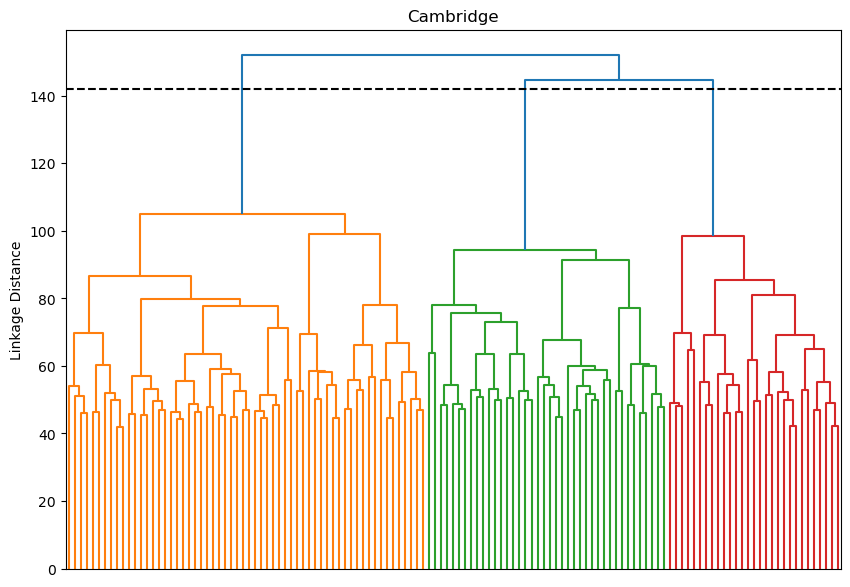

In [98]:
plt.figure(figsize=(10, 7))  
plt.title("Cambridge")  
dend = shc.dendrogram(shc.linkage(df_cam_rtc_cor, method='ward', metric='euclidean'))
plt.axhline(linestyle='--', y=142,c="black")
plt.ylabel('Linkage Distance')
plt.xticks([])
#plt.savefig('../reports/figures/cambridge_dendrogram.png',dpi=500)

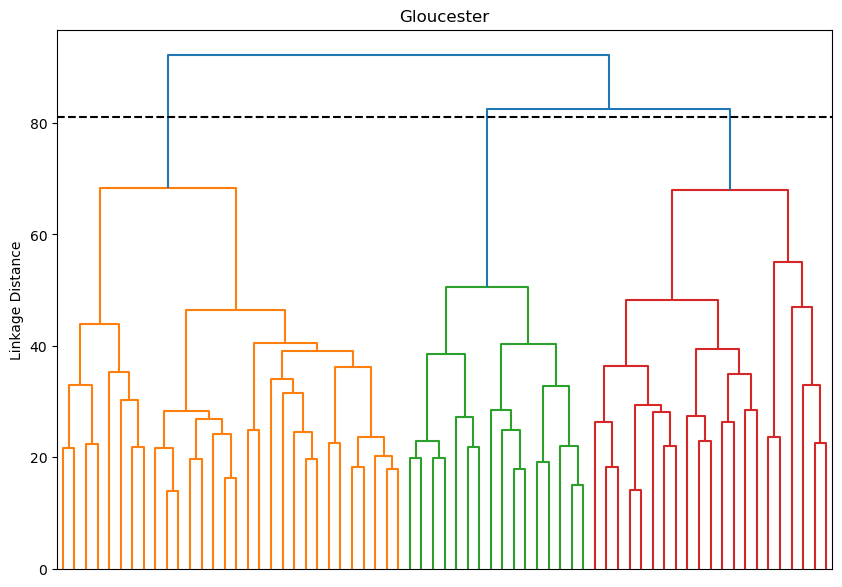

In [130]:
plt.figure(figsize=(10, 7))  
plt.title("Gloucester")  
dend = shc.dendrogram(shc.linkage(df_glo_rtc_cor, method='ward', metric='euclidean'),color_threshold=78,distance_sort=True)
plt.axhline(linestyle='--', y=81,c="black")
plt.ylabel('Linkage Distance')
plt.xticks([])
plt.savefig('../reports/figures/gloucester_dendrogram.png',dpi=500)

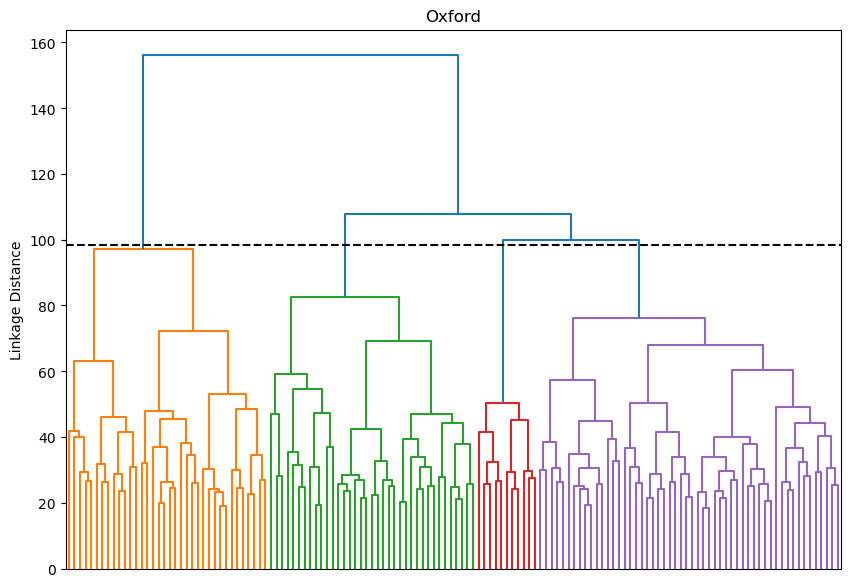

In [101]:
plt.figure(figsize=(10, 7))  
plt.title("Oxford")  
dend = shc.dendrogram(shc.linkage(df_oxf_rtc_cor, method='ward', metric='euclidean'),color_threshold=98,distance_sort=True)
plt.axhline(linestyle='--', y=98.5,c="black")
plt.ylabel('Linkage Distance')
plt.xticks([])
#plt.savefig('../reports/figures/oxford_dendrogram.png',dpi=500)

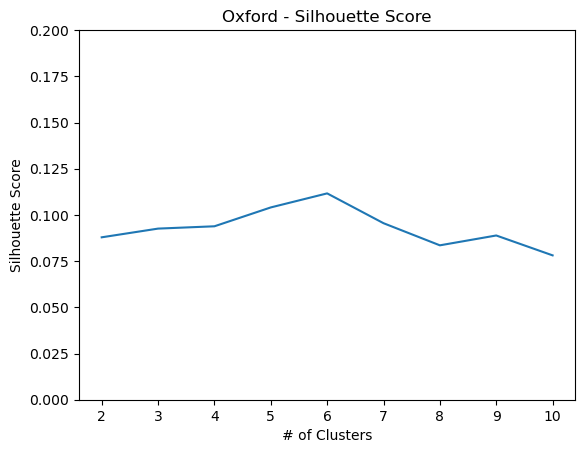

[0.0878870380583316, 0.09259679923245222, 0.09384984118578225, 0.10405713746158668, 0.11165475873090294, 0.09552040073947454, 0.08354575012627767, 0.08887647190458427, 0.07811369272064207]


In [31]:
#df_cam_rtc_cor : .067 (3)
#df_glo_rtc_cor : .067 (2)
#df_oxf_rtc_cor : .082 (4)

sil_score = []
ch_score = []
db_score = []
K = range(2,11,1)


for k in K:
    cluster_features = df_glo_rtc_cor
    agglom_clustering = AgglomerativeClustering(n_clusters=k)
    agglom_temp=agglom_clustering.fit(cluster_features)
    labels = agglom_temp.labels_
    sil_score.append(metrics.silhouette_score(cluster_features, labels, metric='euclidean')) # The score is higher when clusters are dense and well separated
#     ch_score.append(metrics.calinski_harabasz_score(cluster_features, labels)) # The score is higher when clusters are dense and well separated, which relates to a standard concept of a cluster.
#     db_score.append(metrics.davies_bouldin_score(cluster_features, labels)) # Zero is the lowest possible score. Values closer to zero indicate a better partition.

plt.plot(range(2,11,1), sil_score,label="silhouette score")
plt.ylim(0, .2)
plt.xticks(np.arange(2,11, 1.0))
plt.xlabel('# of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Oxford - Silhouette Score')
plt.show()
print(sil_score)

array([ 2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.])

[Text(0, 0, '54 (39%)'),
 Text(0, 0, '37 (27%)'),
 Text(0, 0, '36 (26%)'),
 Text(0, 0, '11 (8%)')]

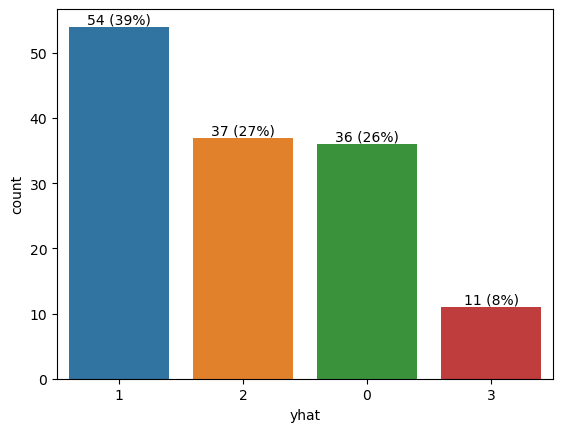

In [9]:
# examine images based on their paths and indexes
#df_cam_rtc_cor : .067 (3) serious cylist
#df_glo_rtc_cor : .067 (3) motorcycle
#df_oxf_rtc_cor : .082 (4) pedestrian

cluster_features = df_oxf_rtc_cor
a=df_oxf_rtc.copy()



agglom_clustering = AgglomerativeClustering(n_clusters=4)
agglom_temp=agglom_clustering.fit(cluster_features)
a["yhat"] = agglom_temp.labels_

#ax = sns.countplot(x="yhat", data=a)
ax = sns.countplot(x=a['yhat'],
                   order=a['yhat'].value_counts(ascending=False).index);
        
abs_values = a['yhat'].value_counts(ascending=False)
rel_values = a['yhat'].value_counts(ascending=False, normalize=True).values * 100
lbls = [f'{p[0]} ({p[1]:.0f}%)' for p in zip(abs_values, rel_values)]
ax.bar_label(container=ax.containers[0], labels=lbls)

# a_summarised =a.groupby("yhat").mean()
# a_summarised["yhat_group"]= np.arange(a_summarised.shape[0])
# a_summarised.plot(x="yhat_group", y=["rtc_count_total"], kind="bar", rot=0,figsize=(12,8),width=1,ylabel="average count")
# a_summarised.plot(x="yhat_group", y=["motorcycle_count"], kind="bar", rot=0,figsize=(12,8),width=1,ylabel="average count")
# a_summarised.plot(x="yhat_group", y=["cycle_count"], kind="bar", rot=0,figsize=(12,8),width=1,ylabel="average count")
# a_summarised.plot(x="yhat_group", y=["pedestrian_count"], kind="bar", rot=0,figsize=(12,8),width=1,ylabel="average count")
# a_summarised.plot(x="yhat_group", y=["serious_count"], kind="bar", rot=0,figsize=(12,8),width=1,ylabel="average count")
# a_summarised.plot(x="yhat_group", y=["dark_count"], kind="bar", rot=0,figsize=(12,8),width=1,ylabel="average count")
# a_summarised.plot(x="yhat_group", y=["wet_count"], kind="bar", rot=0,figsize=(12,8),width=1,ylabel="average count")
# a_summarised.plot(x="yhat_group", y=["serious_cyclist"], kind="bar", rot=0,figsize=(12,8),width=1,ylabel="average count")
# a_summarised.plot(x="yhat_group", y=["serious_pedestrian"], kind="bar", rot=0,figsize=(12,8),width=1,ylabel="average count")
# a_summarised.plot(x="yhat_group", y=["serious_dark"], kind="bar", rot=0,figsize=(12,8),width=1,ylabel="average count")
# a_summarised.plot(x="yhat_group", y=["serious_wet"], kind="bar", rot=0,figsize=(12,8),width=1,ylabel="average count")
# a_summarised.plot(x="yhat_group", y=["serious_dark_wet"], kind="bar", rot=0,figsize=(12,8),width=1,ylabel="average count")
# a_summarised.plot(x="yhat_group", y=["dark_pedestrian"], kind="bar", rot=0,figsize=(12,8),width=1,ylabel="average count")
# a_summarised.plot(x="yhat_group", y=["dark_cyclist"], kind="bar", rot=0,figsize=(12,8),width=1,ylabel="average count")
# a_summarised.plot(x="yhat_group", y=["wet_cyclist"], kind="bar", rot=0,figsize=(12,8),width=1,ylabel="average count")
# a_summarised.plot(x="yhat_group", y=["dark_wet_cyclist"], kind="bar", rot=0,figsize=(12,8),width=1,ylabel="average count")

In [49]:
from scipy.stats import zscore
b=a.iloc[:,np.r_[9220:9226,9241,9246]]
b.apply(zscore).groupby("yhat").mean()

,wet_count,cycle_count,pedestrian_count,motorcycle_count,serious_count,dark_count,rtc_count_total
yhat,,,,,,,
-1.288330,-0.075497,-0.307855,-0.195417,-0.055162,-0.021927,-0.161158,-0.139478
-0.184047,0.108670,0.157541,0.058124,-0.030285,0.007739,0.143497,0.132098
0.920236,0.018364,0.070841,0.025108,0.037622,0.075089,0.024791,-0.016993
2.024518,-0.348160,-0.004139,0.269758,0.202654,-0.218801,-0.260401,-0.134848


In [40]:
from scipy.stats import f_oneway
# no significant differences...
c1 = a.loc[a['yhat'] == 0]["motorcycle_count"]
c2 = a.loc[a['yhat'] == 1]["motorcycle_count"]
c3 = a.loc[a['yhat'] == 2]["motorcycle_count"]
#c4 = a.loc[a['yhat'] == 3]["pedestrian_count"]

f_oneway(c1, c2, c3)

F_onewayResult(statistic=1.9457218727984529, pvalue=0.1512438594146074)

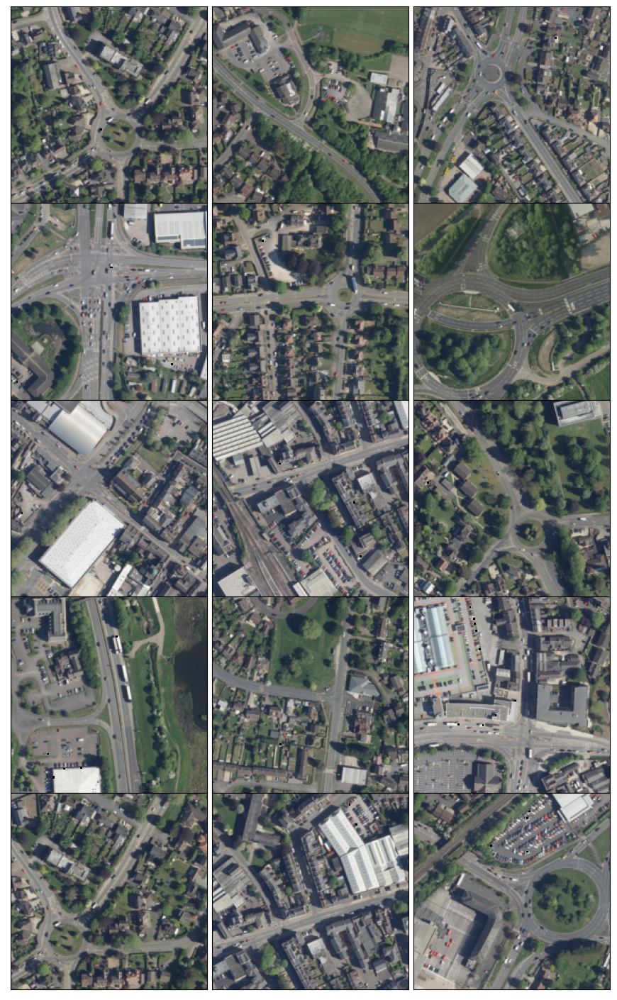

In [27]:
# 6 clusters of both
# Cluster
filelist1 = [filepath_100[a.loc[a['yhat'] == 0]["rtc_count_total"].sort_values(ascending=False).index[0]],
             filepath_100[a.loc[a['yhat'] == 0]["rtc_count_total"].sort_values(ascending=False).index[1]],
             filepath_100[a.loc[a['yhat'] == 0]["rtc_count_total"].sort_values(ascending=False).index[2]],
             filepath_100[a.loc[a['yhat'] == 0]["rtc_count_total"].sort_values(ascending=False).index[6]],
             filepath_100[a.loc[a['yhat'] == 0]["rtc_count_total"].sort_values(ascending=False).index[5]]]

filelist2 = [filepath_100[a.loc[a['yhat'] == 1]["rtc_count_total"].sort_values(ascending=False).index[7]],
             filepath_100[a.loc[a['yhat'] == 1]["rtc_count_total"].sort_values(ascending=False).index[1]],
             filepath_100[a.loc[a['yhat'] == 1]["rtc_count_total"].sort_values(ascending=False).index[2]],
             filepath_100[a.loc[a['yhat'] == 1]["rtc_count_total"].sort_values(ascending=False).index[4]],
             filepath_100[a.loc[a['yhat'] == 1]["rtc_count_total"].sort_values(ascending=False).index[8]]]

filelist3 = [filepath_100[a.loc[a['yhat'] == 2]["rtc_count_total"].sort_values(ascending=False).index[0]],
             filepath_100[a.loc[a['yhat'] == 2]["rtc_count_total"].sort_values(ascending=False).index[6]],
             filepath_100[a.loc[a['yhat'] == 2]["rtc_count_total"].sort_values(ascending=False).index[2]],
             filepath_100[a.loc[a['yhat'] == 2]["rtc_count_total"].sort_values(ascending=False).index[3]],
             filepath_100[a.loc[a['yhat'] == 2]["rtc_count_total"].sort_values(ascending=False).index[4]]]
# filelist4 = [filepath_100[a.loc[a['yhat'] == 3]["rtc_count_total"].sort_values(ascending=False).index[0]],
#              filepath_100[a.loc[a['yhat'] == 3]["rtc_count_total"].sort_values(ascending=False).index[1]],
#              filepath_100[a.loc[a['yhat'] == 3]["rtc_count_total"].sort_values(ascending=False).index[2]],
#              filepath_100[a.loc[a['yhat'] == 3]["rtc_count_total"].sort_values(ascending=False).index[3]],
#              filepath_100[a.loc[a['yhat'] == 3]["rtc_count_total"].sort_values(ascending=False).index[4]],
#              filepath_100[a.loc[a['yhat'] == 3]["rtc_count_total"].sort_values(ascending=False).index[5]]]


mylist = filelist1,filelist2,filelist3,#filelist4#,filelist5,filelist6,filelist7,filelist8

plt.figure(figsize=(11, 18))
for i in [0,1,2]:
    ax = plt.subplot(5,3, 1 + i)
    plt.imshow(tifffile.imread(mylist[i][0])/255)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    ax.set_aspect('equal')
    
    ax = plt.subplot(5,3, 4+ i)
    plt.imshow(tifffile.imread(mylist[i][1])/255)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    ax.set_aspect('equal')
    
    ax = plt.subplot(5,3, 7 + i)
    plt.imshow(tifffile.imread(mylist[i][2])/255)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    ax.set_aspect('equal')
    
    ax = plt.subplot(5,3, 10 + i)
    plt.imshow(tifffile.imread(mylist[i][3])/255)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    ax.set_aspect('equal')
    
    ax = plt.subplot(5,3, 13 + i)
    plt.imshow(tifffile.imread(mylist[i][4])/255)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    ax.set_aspect('equal')
    

plt.subplots_adjust(wspace=0, hspace=0.0)

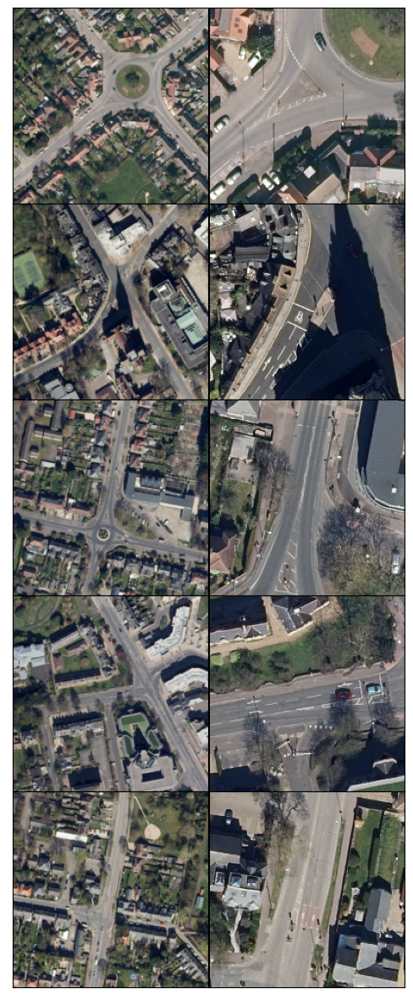

In [125]:
# CAMBRIDGE
#Serious
filelist1 = [filepath_100[a.loc[a['yhat'] == 1]["rtc_count_total"].sort_values(ascending=False).index[0]],
             filepath_100[a.loc[a['yhat'] == 1]["rtc_count_total"].sort_values(ascending=False).index[1]],
             filepath_100[a.loc[a['yhat'] == 1]["rtc_count_total"].sort_values(ascending=False).index[2]],
             filepath_100[a.loc[a['yhat'] == 1]["rtc_count_total"].sort_values(ascending=False).index[3]],
             filepath_100[a.loc[a['yhat'] == 1]["rtc_count_total"].sort_values(ascending=False).index[4]]]

filelist2 = [filepath_25[a.loc[a['yhat'] == 1]["rtc_count_total"].sort_values(ascending=False).index[0]],
             filepath_25[a.loc[a['yhat'] == 1]["rtc_count_total"].sort_values(ascending=False).index[1]],
             filepath_25[a.loc[a['yhat'] == 1]["rtc_count_total"].sort_values(ascending=False).index[2]],
             filepath_25[a.loc[a['yhat'] == 1]["rtc_count_total"].sort_values(ascending=False).index[3]],
             filepath_25[a.loc[a['yhat'] == 1]["rtc_count_total"].sort_values(ascending=False).index[4]]]

# 4 Cycle



mylist = filelist1,filelist2

plt.figure(figsize=(6, 15))
for i in [0,1]:
    ax = plt.subplot(5,2, 1 + i)
    plt.imshow(tifffile.imread(mylist[i][0])/255)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    ax.set_aspect('equal')
    
    ax = plt.subplot(5,2,3 + i)
    plt.imshow(tifffile.imread(mylist[i][1])/255)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    ax.set_aspect('equal')
    
    ax = plt.subplot(5,2, 5 + i)
    plt.imshow(tifffile.imread(mylist[i][2])/255)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    ax.set_aspect('equal')
    
    ax = plt.subplot(5,2, 7 + i)
    plt.imshow(tifffile.imread(mylist[i][3])/255)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    ax.set_aspect('equal')
    
    ax = plt.subplot(5,2, 9 + i)
    plt.imshow(tifffile.imread(mylist[i][4])/255)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    ax.set_aspect('equal')
    

plt.subplots_adjust(wspace=0, hspace=0.0)

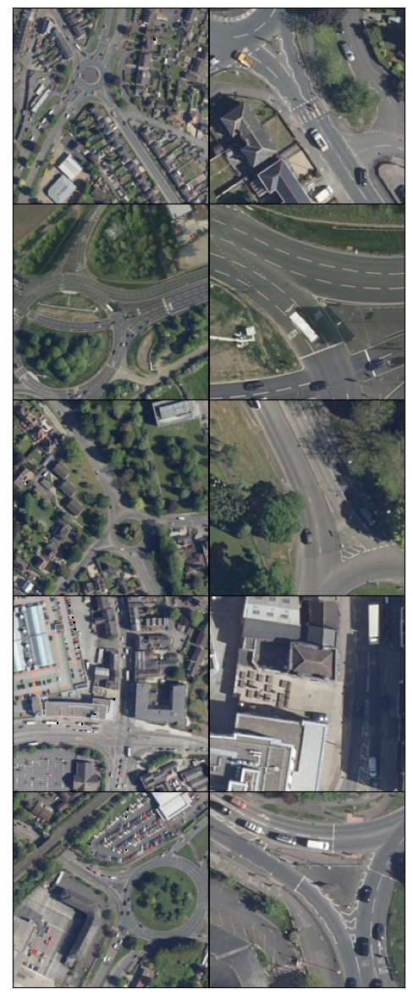

In [132]:
# GLOUCESTER
#Serious
filelist1 = [filepath_100[a.loc[a['yhat'] == 2]["rtc_count_total"].sort_values(ascending=False).index[0]],
             filepath_100[a.loc[a['yhat'] == 2]["rtc_count_total"].sort_values(ascending=False).index[6]],
             filepath_100[a.loc[a['yhat'] == 2]["rtc_count_total"].sort_values(ascending=False).index[2]],
             filepath_100[a.loc[a['yhat'] == 2]["rtc_count_total"].sort_values(ascending=False).index[3]],
             filepath_100[a.loc[a['yhat'] == 2]["rtc_count_total"].sort_values(ascending=False).index[4]]]

filelist2 = [filepath_25[a.loc[a['yhat'] == 2]["rtc_count_total"].sort_values(ascending=False).index[0]],
             filepath_25[a.loc[a['yhat'] == 2]["rtc_count_total"].sort_values(ascending=False).index[6]],
             filepath_25[a.loc[a['yhat'] == 2]["rtc_count_total"].sort_values(ascending=False).index[2]],
             filepath_25[a.loc[a['yhat'] == 2]["rtc_count_total"].sort_values(ascending=False).index[3]],
             filepath_25[a.loc[a['yhat'] == 2]["rtc_count_total"].sort_values(ascending=False).index[4]]]

# 4 Cycle



mylist = filelist1,filelist2

plt.figure(figsize=(6, 15))
for i in [0,1]:
    ax = plt.subplot(5,2, 1 + i)
    plt.imshow(tifffile.imread(mylist[i][0])/255)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    ax.set_aspect('equal')
    
    ax = plt.subplot(5,2,3 + i)
    plt.imshow(tifffile.imread(mylist[i][1])/255)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    ax.set_aspect('equal')
    
    ax = plt.subplot(5,2, 5 + i)
    plt.imshow(tifffile.imread(mylist[i][2])/255)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    ax.set_aspect('equal')
    
    ax = plt.subplot(5,2, 7 + i)
    plt.imshow(tifffile.imread(mylist[i][3])/255)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    ax.set_aspect('equal')
    
    ax = plt.subplot(5,2, 9 + i)
    plt.imshow(tifffile.imread(mylist[i][4])/255)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    ax.set_aspect('equal')
    

plt.subplots_adjust(wspace=0, hspace=0.0)

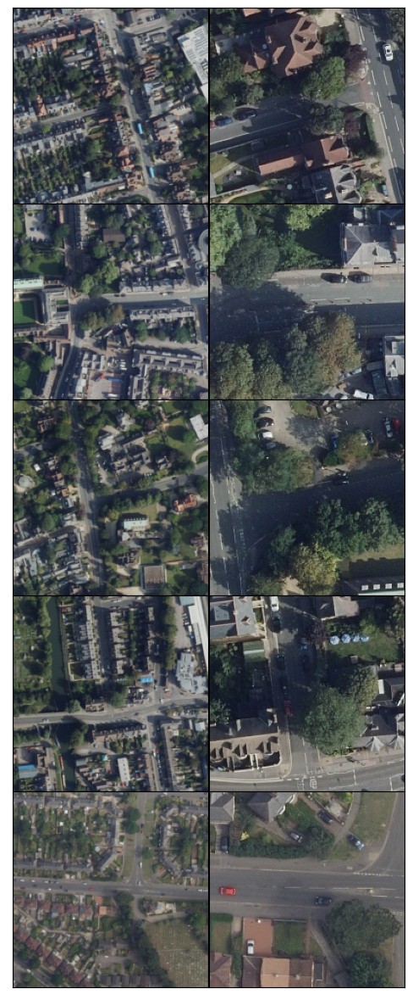

In [73]:
# OXFORD
#Serious
filelist1 = [filepath_100[a.loc[a['yhat'] == 3]["rtc_count_total"].sort_values(ascending=False).index[5]],
             filepath_100[a.loc[a['yhat'] == 3]["rtc_count_total"].sort_values(ascending=False).index[1]],
             filepath_100[a.loc[a['yhat'] == 3]["rtc_count_total"].sort_values(ascending=False).index[2]],
             filepath_100[a.loc[a['yhat'] == 3]["rtc_count_total"].sort_values(ascending=False).index[3]],
             filepath_100[a.loc[a['yhat'] == 3]["rtc_count_total"].sort_values(ascending=False).index[7]]]

filelist2 = [filepath_25[a.loc[a['yhat'] == 3]["rtc_count_total"].sort_values(ascending=False).index[5]],
             filepath_25[a.loc[a['yhat'] == 3]["rtc_count_total"].sort_values(ascending=False).index[1]],
             filepath_25[a.loc[a['yhat'] == 3]["rtc_count_total"].sort_values(ascending=False).index[2]],
             filepath_25[a.loc[a['yhat'] == 3]["rtc_count_total"].sort_values(ascending=False).index[3]],
             filepath_25[a.loc[a['yhat'] == 3]["rtc_count_total"].sort_values(ascending=False).index[7]]]

# 4 Cycle



mylist = filelist1,filelist2

plt.figure(figsize=(6, 15))
for i in [0,1]:
    ax = plt.subplot(5,2, 1 + i)
    plt.imshow(tifffile.imread(mylist[i][0])/255)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    ax.set_aspect('equal')
    
    ax = plt.subplot(5,2,3 + i)
    plt.imshow(tifffile.imread(mylist[i][1])/255)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    ax.set_aspect('equal')
    
    ax = plt.subplot(5,2, 5 + i)
    plt.imshow(tifffile.imread(mylist[i][2])/255)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    ax.set_aspect('equal')
    
    ax = plt.subplot(5,2, 7 + i)
    plt.imshow(tifffile.imread(mylist[i][3])/255)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    ax.set_aspect('equal')
    
    ax = plt.subplot(5,2, 9 + i)
    plt.imshow(tifffile.imread(mylist[i][4])/255)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    ax.set_aspect('equal')
    

plt.subplots_adjust(wspace=0, hspace=0.0)

In [20]:
filelist1 = [a.loc[a['yhat'] == 1]["rtc_count_total"].sort_values(ascending=False).index[0],
             a.loc[a['yhat'] == 1]["rtc_count_total"].sort_values(ascending=False).index[1],
             a.loc[a['yhat'] == 1]["rtc_count_total"].sort_values(ascending=False).index[2],
             a.loc[a['yhat'] == 1]["rtc_count_total"].sort_values(ascending=False).index[3],
             a.loc[a['yhat'] == 1]["rtc_count_total"].sort_values(ascending=False).index[4]]

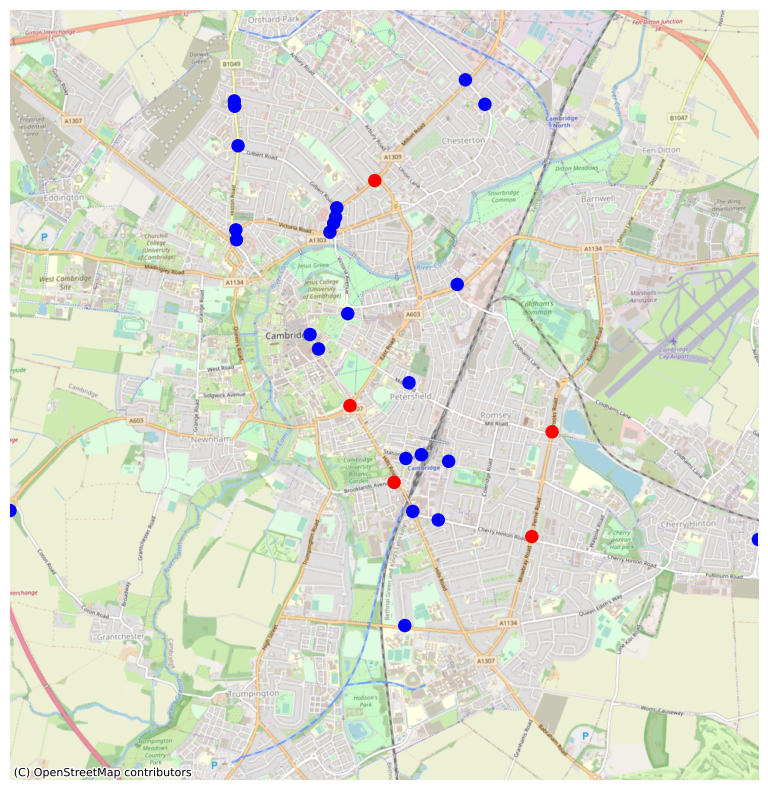

In [21]:
# Cambridge
gdf = gpd.GeoDataFrame(a, geometry=gpd.points_from_xy(a.X, a.Y))
gdf = gdf.set_crs('epsg:27700')



options = [1]
gdf2 = gdf.copy()
minx, miny, maxx, maxy = gdf2.total_bounds
# selecting rows based on condition
gdf2 = gdf2[gdf2['yhat'].isin(options)]
gdf2['yhat'] = gdf2['yhat'].astype(str)
gdf2.loc[[*filelist1],'yhat'] = "Displayed Serious Cycle RTCs Points"

# gdf2['yhat'] = [w.replace('0', 'Cluster A') for w in gdf2['yhat']]
# gdf2['yhat'] = [w.replace('1', 'Clusuter B') for w in gdf2['yhat']]
gdf2['yhat'] = [w.replace('1', 'Other Serious Cycle RTC Locations') for w in gdf2['yhat']]

cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["red","blue"])
ax = gdf2.plot(figsize=(10, 10), alpha=1, column="yhat", cmap= cmap,categorical=True,markersize=75,legend=False)
ax.set_xlim(minx, maxx)
ax.set_ylim(miny, maxy)

plt.axis("off")
#cx.add_basemap(ax, crs=gdf.crs,source=cx.providers.Stamen.Toner)
cx.add_basemap(ax, crs=gdf.crs,source=cx.providers.OpenStreetMap.Mapnik)


In [24]:
filelist1 = [a.loc[a['yhat'] == 2]["rtc_count_total"].sort_values(ascending=False).index[0],
             a.loc[a['yhat'] == 2]["rtc_count_total"].sort_values(ascending=False).index[6],
             a.loc[a['yhat'] == 2]["rtc_count_total"].sort_values(ascending=False).index[2],
             a.loc[a['yhat'] == 2]["rtc_count_total"].sort_values(ascending=False).index[3],
             a.loc[a['yhat'] == 2]["rtc_count_total"].sort_values(ascending=False).index[4]]

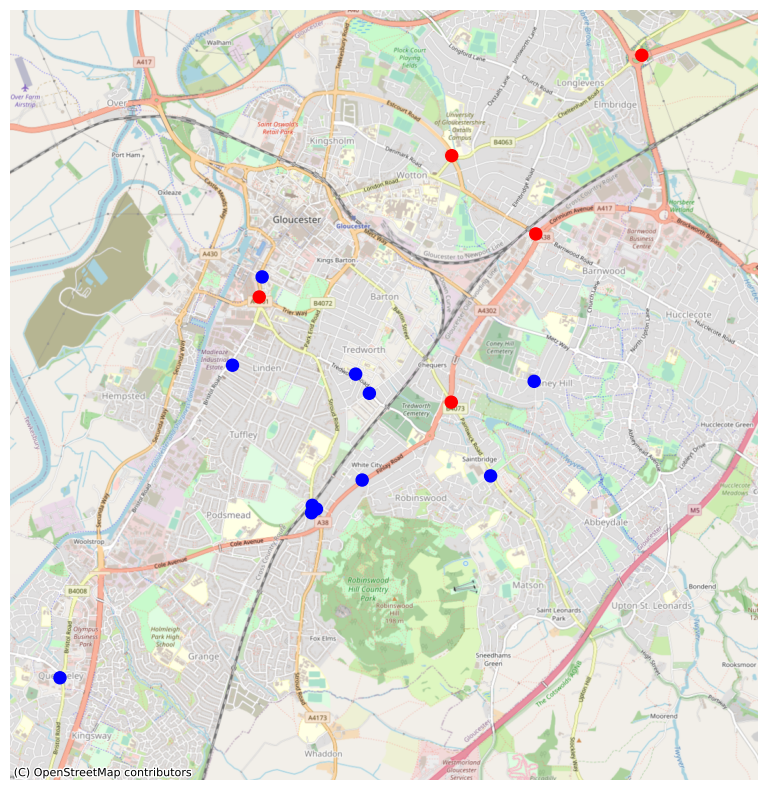

In [25]:
# Gloucester
gdf = gpd.GeoDataFrame(a, geometry=gpd.points_from_xy(a.X, a.Y))
gdf = gdf.set_crs('epsg:27700')



options = [2]
gdf2 = gdf.copy()
minx, miny, maxx, maxy = gdf2.total_bounds
# selecting rows based on condition
gdf2 = gdf2[gdf2['yhat'].isin(options)]
gdf2['yhat'] = gdf2['yhat'].astype(str)
gdf2.loc[[*filelist1],'yhat'] = "Displayed Motorcycle RTC Points"

# gdf2['yhat'] = [w.replace('0', 'Cluster A') for w in gdf2['yhat']]
# gdf2['yhat'] = [w.replace('1', 'Clusuter B') for w in gdf2['yhat']]
gdf2['yhat'] = [w.replace('2', 'Other Motorcycle RTC Locations') for w in gdf2['yhat']]

cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["red","blue"])
ax = gdf2.plot(figsize=(10, 10), alpha=1, column="yhat", cmap= cmap,categorical=True,markersize=75,legend=False)
ax.set_xlim(minx, maxx)
ax.set_ylim(miny, maxy)

plt.axis("off")
#cx.add_basemap(ax, crs=gdf.crs,source=cx.providers.Stamen.Toner)
cx.add_basemap(ax, crs=gdf.crs,source=cx.providers.OpenStreetMap.Mapnik)


In [11]:
filelist1 = [a.loc[a['yhat'] == 3]["rtc_count_total"].sort_values(ascending=False).index[5],
             a.loc[a['yhat'] == 3]["rtc_count_total"].sort_values(ascending=False).index[1],
             a.loc[a['yhat'] == 3]["rtc_count_total"].sort_values(ascending=False).index[2],
             a.loc[a['yhat'] == 3]["rtc_count_total"].sort_values(ascending=False).index[3],
             a.loc[a['yhat'] == 3]["rtc_count_total"].sort_values(ascending=False).index[7]]

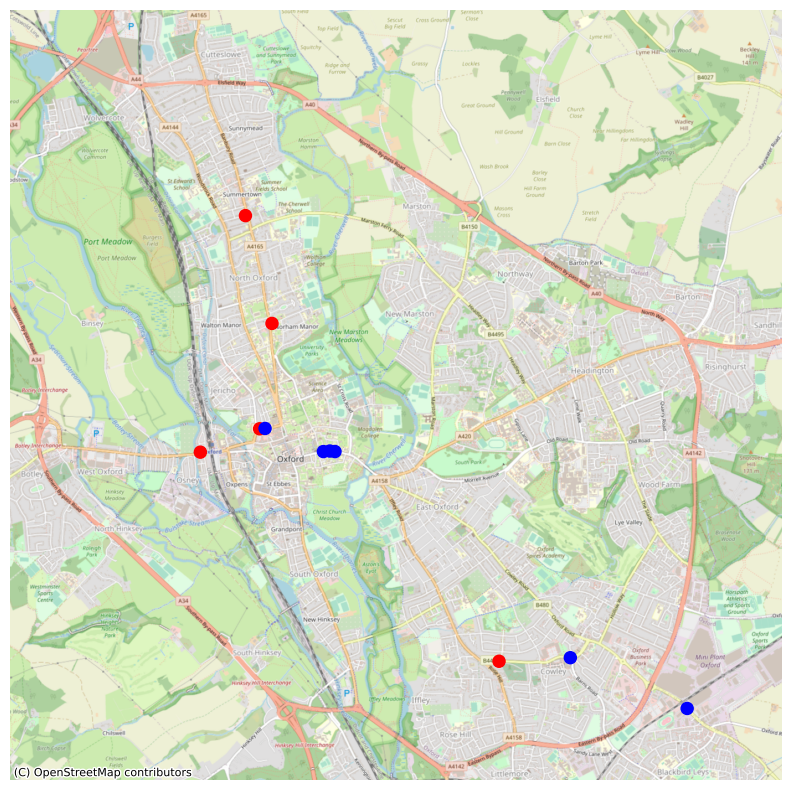

In [17]:
# Oxford
gdf = gpd.GeoDataFrame(a, geometry=gpd.points_from_xy(a.X, a.Y))
gdf = gdf.set_crs('epsg:27700')



options = [3]
gdf2 = gdf.copy()
minx, miny, maxx, maxy = gdf2.total_bounds
# selecting rows based on condition
gdf2 = gdf2[gdf2['yhat'].isin(options)]
gdf2['yhat'] = gdf2['yhat'].astype(str)
gdf2.loc[[*filelist1],'yhat'] = "Displayed Pedestrian RTC Points"

# gdf2['yhat'] = [w.replace('0', 'Cluster A') for w in gdf2['yhat']]
# gdf2['yhat'] = [w.replace('1', 'Clusuter B') for w in gdf2['yhat']]
gdf2['yhat'] = [w.replace('3', 'Other Pedestrian RTC Locations') for w in gdf2['yhat']]

cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["red","blue"])
ax = gdf2.plot(figsize=(10, 10), alpha=1, column="yhat", cmap= cmap,categorical=True,markersize=75,legend=False)
ax.set_xlim(minx, maxx)
ax.set_ylim(miny, maxy)

plt.axis("off")
#cx.add_basemap(ax, crs=gdf.crs,source=cx.providers.Stamen.TonerLite)
cx.add_basemap(ax, crs=gdf.crs,source=cx.providers.OpenStreetMap.Mapnik)
#cx.add_basemap(ax, crs=gdf.crs,source=cx.providers.OpenStreetMap.BlackAndWhite)

In [111]:
gdf2.total_bounds

array([448327.25, 202754.25, 456574.75, 210983.5 ])

# RTC Mapping

In [19]:
from matplotlib_scalebar.scalebar import ScaleBar

In [20]:
# Cambridge
#df_cam_rtc = df_cam[df_cam["rtc_count_total"]>=3]
df_cam['hazardous_road_segment'] = np.where(df_cam['rtc_count_total']>=3,1,0)
df_cam['rtc_having_segment'] = np.where(df_cam['rtc_count_total']>=1,1,0)
print(df_cam['hazardous_road_segment'].value_counts())
print(df_cam['rtc_having_segment'].value_counts())
df_cam_map = df_cam[df_cam["X"]!=0]

0    2647
1     129
Name: hazardous_road_segment, dtype: int64
0    2197
1     579
Name: rtc_having_segment, dtype: int64


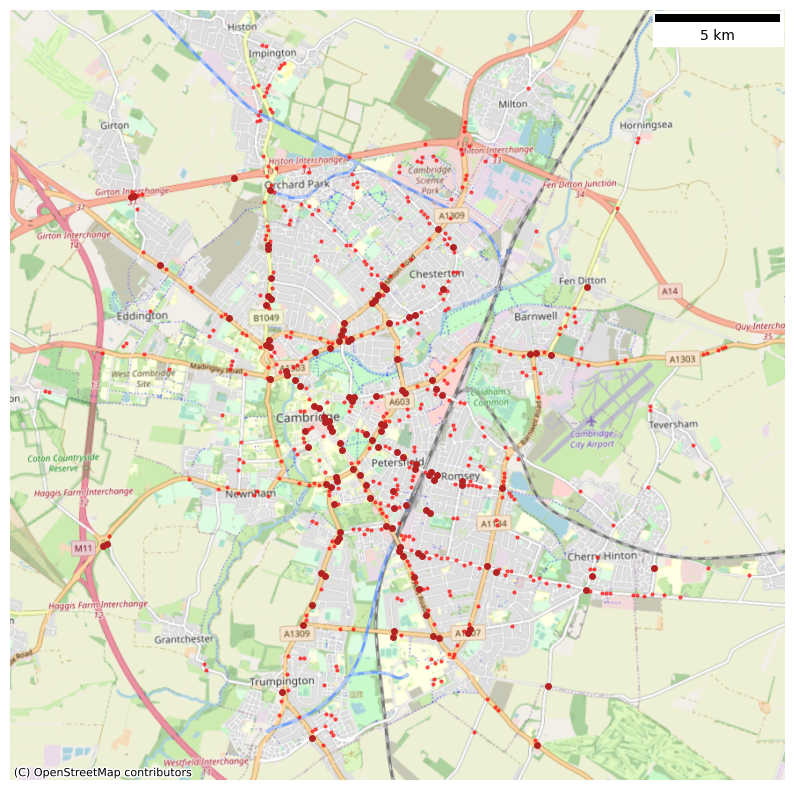

In [22]:
gdf = gpd.GeoDataFrame(df_cam_map, geometry=gpd.points_from_xy(df_cam_map.X, df_cam_map.Y))
gdf = gdf.set_crs('epsg:27700')

gdf1 = gdf[gdf["hazardous_road_segment"]==0]
gdf2 = gdf[gdf["hazardous_road_segment"]==1]

ax = gdf1.plot(figsize=(10, 10), alpha=.6,color="red",markersize=4, legend=True)
gdf2.plot(ax=ax, alpha=1, column="hazardous_road_segment",color="firebrick",markersize=16, legend=True)
ax.add_artist(ScaleBar(3))
plt.axis("off")
#cx.add_basemap(ax, crs=gdf.crs,source=cx.providers.Stamen.Toner)
cx.add_basemap(ax, crs=gdf.crs,source=cx.providers.OpenStreetMap.Mapnik)
#cx.add_basemap(ax, crs=gdf.crs,source=cx.providers.Stamen.TonerLite)
#plt.savefig("../reports/figures/cambridge_rtc_plot.svg", format="svg",dpi=300)
plt.show()

In [23]:
# Oxford
#df_cam_rtc = df_cam[df_cam["rtc_count_total"]>=3]
df_oxf['hazardous_road_segment'] = np.where(df_oxf['rtc_count_total']>=3,1,0)
df_oxf['rtc_having_segment'] = np.where(df_oxf['rtc_count_total']>=1,1,0)
print(df_oxf['hazardous_road_segment'].value_counts())
print(df_oxf['rtc_having_segment'].value_counts())
df_oxf_map = df_oxf[df_oxf["X"]!=0]

0    3016
1     138
Name: hazardous_road_segment, dtype: int64
0    2555
1     599
Name: rtc_having_segment, dtype: int64


C:\Users\jfrancis\Anaconda3\lib\site-packages\geopandas\plotting.py:656: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(


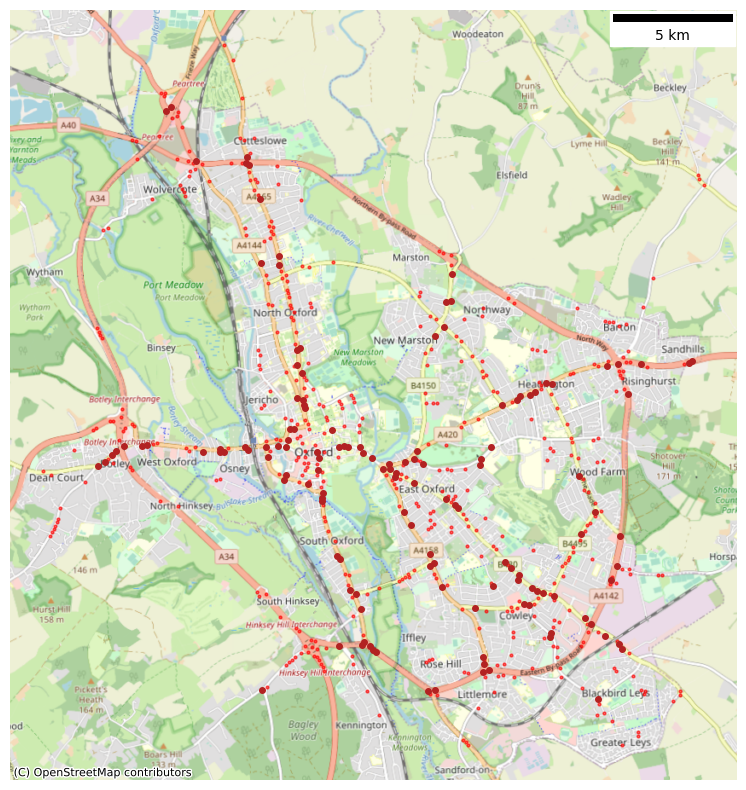

In [24]:
gdf = gpd.GeoDataFrame(df_oxf_map, geometry=gpd.points_from_xy(df_oxf_map.X, df_oxf_map.Y))
gdf = gdf.set_crs('epsg:27700')

gdf1 = gdf[gdf["hazardous_road_segment"]==0]
gdf2 = gdf[gdf["hazardous_road_segment"]==1]

ax = gdf1.plot(figsize=(10, 10), alpha=.6,color="red",markersize=4, legend=True)
gdf2.plot(ax=ax, alpha=1, column="hazardous_road_segment",color="firebrick",markersize=16, legend=True)
plt.axis("off")
ax.add_artist(ScaleBar(3))
#cx.add_basemap(ax, crs=gdf.crs,source=cx.providers.Stamen.Toner)
cx.add_basemap(ax, crs=gdf.crs,source=cx.providers.OpenStreetMap.Mapnik)
#plt.savefig("../reports/figures/oxford_rtc_plot.svg", format="svg",dpi=300)
plt.show()

In [25]:
# Gloucester
#df_cam_rtc = df_cam[df_cam["rtc_count_total"]>=3]
df_glo['hazardous_road_segment'] = np.where(df_glo['rtc_count_total']>=3,1,0)
df_glo['rtc_having_segment'] = np.where(df_glo['rtc_count_total']>=1,1,0)
print(df_glo['hazardous_road_segment'].value_counts())
print(df_glo['rtc_having_segment'].value_counts())
df_glo_map = df_glo[df_glo["X"]!=0]

0    2962
1      67
Name: hazardous_road_segment, dtype: int64
0    2632
1     397
Name: rtc_having_segment, dtype: int64


C:\Users\jfrancis\Anaconda3\lib\site-packages\geopandas\plotting.py:656: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(


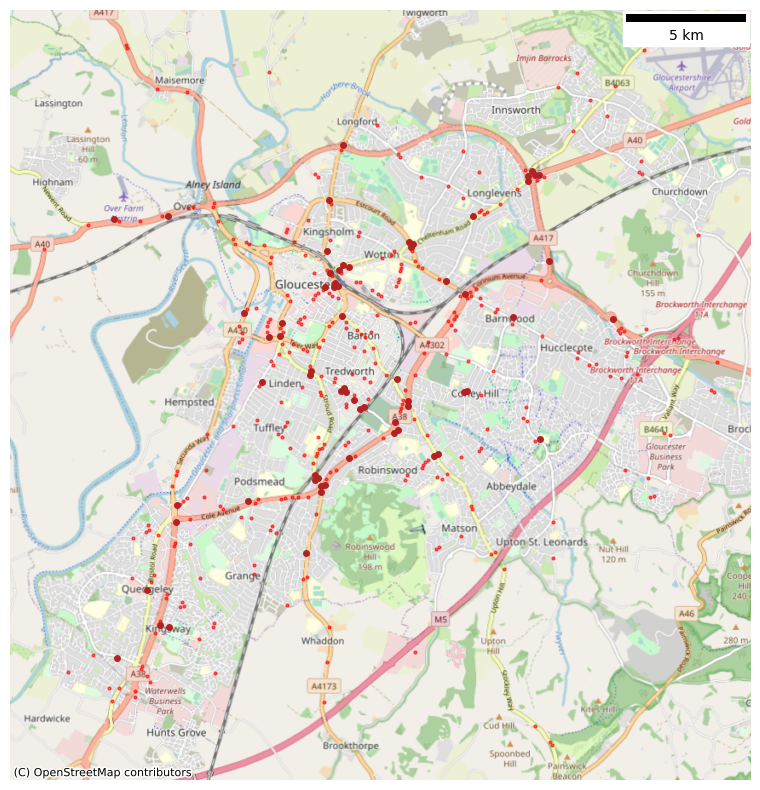

In [26]:
gdf = gpd.GeoDataFrame(df_glo_map, geometry=gpd.points_from_xy(df_glo_map.X, df_glo_map.Y))
gdf = gdf.set_crs('epsg:27700')

gdf1 = gdf[gdf["hazardous_road_segment"]==0]
gdf2 = gdf[gdf["hazardous_road_segment"]==1]

ax = gdf1.plot(figsize=(10, 10), alpha=.6,color="red",markersize=4, legend=True)
gdf2.plot(ax=ax, alpha=1, column="hazardous_road_segment",color="firebrick",markersize=16, legend=True)
ax.add_artist(ScaleBar(3))
plt.axis("off")
#cx.add_basemap(ax, crs=gdf.crs,source=cx.providers.Stamen.Toner)
cx.add_basemap(ax, crs=gdf.crs,source=cx.providers.OpenStreetMap.Mapnik)
#plt.savefig("../reports/figures/gloucester_rtc_plot.svg", format="svg",dpi=300)
plt.show()